# INPUT

In [1]:
############################
# Imports...
############################
%run -i src/raw_import.py
%run -i src/classes/class_prm_eco.py
%run -i src/classes/class_prm_tech.py
%run -i src/classes/class_technos.py

opt_model = cpx.Model(name="cineaste model")

############################
# Economic parameters
############################
r = 0.05
# [TO REDO]
cost_co2 = 50 # [€/t]

############################
# Time data
############################

years = range(2020, 2050+1)
hours = range(1, 8761)
U = np.arange(0, 8760, 1)

############################
# demand
############################

demand = np.loadtxt('../data/formatted/demand/2019.inc').tolist()
dict_demand = {(year, hour): demand[hour-1] for year in years for hour in hours}

############################
# production
############################

data_techno   = {} # dict of output for each year : data_techno[index] => techno
index = 1
%run -i src/load_data/nuclear/historic.py
%run -i src/load_data/nuclear/new.py
%run -i src/load_data/gas/ccgt.py
%run -i src/load_data/ren/pv.py
%run -i src/load_data/ren/won.py
%run -i src/load_data/ren/wof.py


In [2]:
#dict_demand[2020,1]
#data_techno[6].get_prm_tech().get_LF()


# Plotting the cost curves

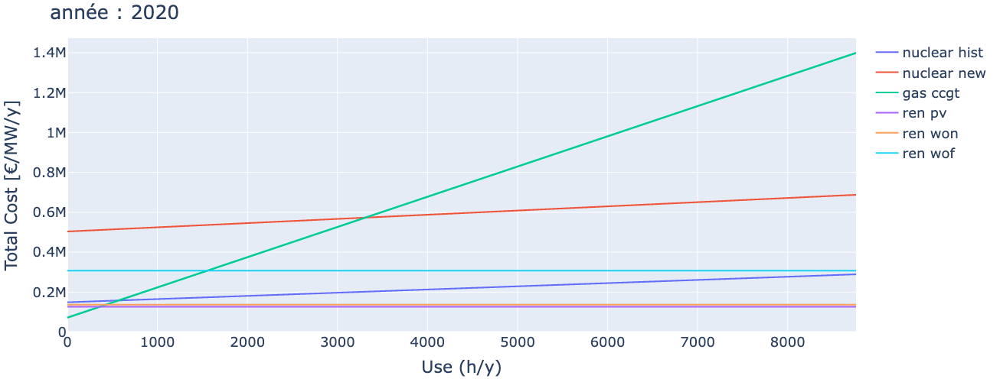

In [2]:
year = 2020

fig = go.Figure()
for tec in data_techno.keys():
    n = data_techno[tec].get_name() + ' ' + data_techno[tec].get_type()
    fig.add_trace(go.Scatter(x=U,y=data_techno[tec].get_prm_eco().get_cost_profile(),line=dict(width=2.0,shape='hv'),mode='lines',name=n))

fig.update_layout(title="année : " + str(year),yaxis_title='Total Cost [€/MW/y]',xaxis_title="Use (h/y)",
                  width=1000,height=500,margin=dict(l=50,r=150,b=30,t=50),font=dict(size=18))
fig.show()

# Model declaration and resoluton

In [3]:
opt_model.clear()

######################################
# Variables
######################################

var_P = {} # Capacity : var_P[tec,y]
var_E = {} # Energy : var_E[tec,y,h]
var_C = {} # Curtailment : var_C[tec,y,h]

max_P = max(dict_demand.values())
            
var_P = {(tec, y): opt_model.continuous_var(name=f'var_P_{tec}_{y}', lb=0, ub=max_P) for tec in data_techno.keys() for y in years}
var_E = {(tec, y, h): opt_model.continuous_var(name=f'var_E_{tec}_{y}_{h}', lb=0, ub=max_P) for tec in data_techno.keys() for y in years for h in hours}

######################################
# Constraints 
######################################

# ----------------------------------------------
# Sum_{tec} (supply (tec,y,h)) >= Demand (y,t)
# ----------------------------------------------

# Precompute sum values for each (y, h) combination
sum_var_E = {(y, h): opt_model.sum(var_E[tec, y, h] for tec in data_techno.keys()) for y in years for h in hours}

# Add constraints using precomputed sum values
for y in years:
    for h in hours:
        opt_model.add_constraint(ct = sum_var_E[y, h] >= dict_demand[y, h])

#for y in years:
#    for h in hours:
#        opt_model.add_constraint(ct = opt_model.sum(var_E[tec,y,h] for tec in data_techno.keys())  >= dict_demand[y,h])

# ----------------------------------------------
# Exogeneous variable => Fixed
# ----------------------------------------------
for tec in data_techno.keys():
        for y in years:
            if data_techno[tec].get_prm_tech().get_isPvar()[y] == False:
                opt_model.add_constraint(ct = var_P[tec,y] == data_techno[tec].get_prm_tech().get_P()[y])
                for h in hours:
                    if data_techno[tec].get_prm_tech().get_isEvar()[y,h] == False:
                        opt_model.add_constraint(ct = var_E[tec,y,h] == data_techno[tec].get_prm_tech().get_E()[y,h])
    
# ----------------------------------------------
# Fatal energy : E(tec,y,t) = LF(tec,y,t) * P(tec,y)
# ----------------------------------------------
for tec in data_techno.keys():
    if data_techno[tec].get_prm_tech().get_isFatal() == True:
            for y in years:
                for h in hours:
                    opt_model.add_constraint(ct = var_E[tec,y,h] == data_techno[tec].get_prm_tech().get_LF()[y,h] * var_P[tec,y])

# ----------------------------------------------
# E <= P * 1h for each machines
# ----------------------------------------------
for tec in data_techno.keys():
    if data_techno[tec].get_prm_tech().get_isEvar():
        for y in years:
            for h in hours:
                opt_model.add_constraint(ct = var_E[tec,y,h] <= var_P[tec,y])

# ----------------------------------------------
# sum(P) >= max demand
# ----------------------------------------------
for y in years:
    max_P_y = max(dict_demand[y, h] for h in hours)
    opt_model.add_constraint(ct = opt_model.sum( var_P[tec,y] for tec in data_techno.keys() ) >= max_P_y )
    
# ----------------------------------------------
# TO DEFINE
# ----------------------------------------------

# Curtailment
# Load Following
# ETC.


In [4]:
######################################
# Obj function + Solve
######################################

# Compute fixed and variable costs
sum_fixed_cost    = {(y): opt_model.sum(var_P[tec,y] * data_techno[tec].get_prm_eco().get_fix_tot() for tec in data_techno.keys()) for y in years}
sum_variable_cost = {(y,h): opt_model.sum(var_E[tec,y,h] * data_techno[tec].get_prm_eco().get_var_tot() for tec in data_techno.keys()) for y in years for h in hours}

# Total cost 
objective = opt_model.sum(sum_fixed_cost[y] for y in years) + opt_model.sum(sum_variable_cost[y,h] for y in years for h in hours)

# Solve
opt_model.minimize(objective)
solution = opt_model.solve()

#print("Solution status:", opt_model.solve_details.status)
#print("Objective value:", opt_model.objective_value)
#print("Time spent in solving:", opt_model.solve_details.time)


In [5]:
######################################
# Store data
######################################

E = {}
P = {}

for tec in data_techno.keys():
    P = {y: var_P[tec,y].solution_value for y in years}
    E = {(y, h): var_E[tec,y,h].solution_value for y in years for h in hours}
    data_techno[tec].get_prm_tech().set_P(copy.deepcopy(P))
    data_techno[tec].get_prm_tech().set_E(copy.deepcopy(E))

# Plot results

In [8]:
#data_techno[tec].get_prm_tech().get_E().keys()
#[data_techno[tec].get_prm_tech().get_E()[(year, h)] for h in hours]

#[data_techno[tec].get_prm_tech().get_E()[2020,h].keys() for h in hours]

### Mix at a time step

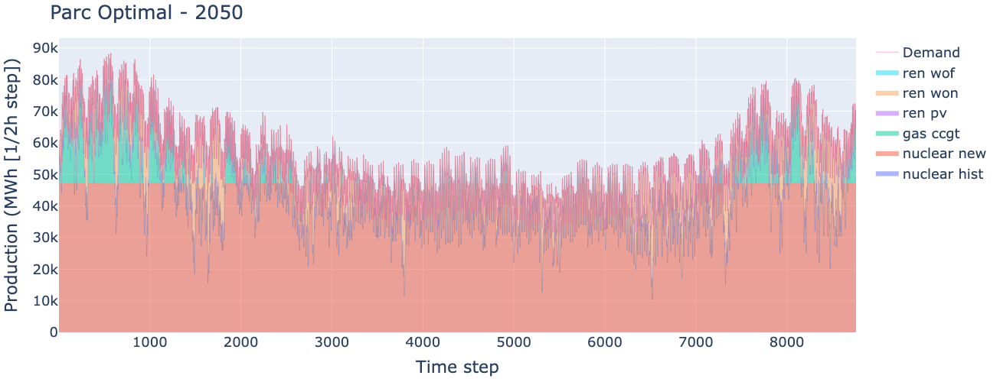

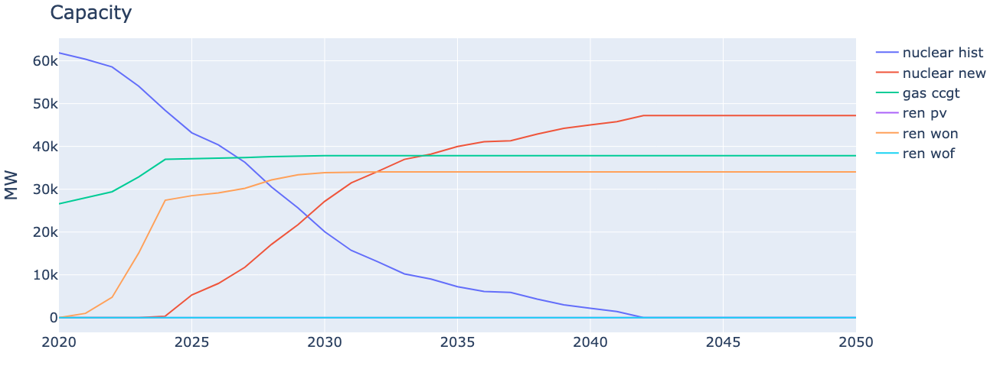

In [6]:
fig = go.Figure()
year = 2050


for tec in data_techno.keys():
    name = data_techno[tec].get_name() + ' ' + data_techno[tec].get_type()
    x = [h for y, h in data_techno[tec].get_prm_tech().get_E().keys() if y == year]
    vals = [data_techno[tec].get_prm_tech().get_E()[(year, h)] for h in x]
    fig.add_trace(go.Scatter(x=x,y=vals,stackgroup='one',line=dict(width=0.2),name=name))

x = [h for y, h in dict_demand.keys() if y == year]
vals = [dict_demand[(year, h)] for h in x]
fig.add_trace(go.Scatter(x=x,y=vals,mode='lines',line=dict(width=1.0),opacity=0.50,name='Demand'))

fig.update_layout(title="Parc Optimal - " + str(year),
                  yaxis_title='Production (MWh [1/2h step])',
                  xaxis_title="Time step",
                  #barmode='stack',
                  width=1000,height=500,margin=dict(l=50,r=150,b=30,t=50),font=dict(size=18))
fig.show()

print()

fig = go.Figure()

for tec in data_techno.keys():
    name = data_techno[tec].get_name() + ' ' + data_techno[tec].get_type()
    x    = list(data_techno[tec].get_prm_tech().get_P().keys())
    vals = list(data_techno[tec].get_prm_tech().get_P().values())
    fig.add_trace(go.Scatter(x=x,y=vals,line=dict(width=2.0),name=name))

fig.update_layout(title="Capacity",
                  yaxis_title='MW',
                  xaxis_title="",
                  #barmode='stack',
                  width=1000,height=500,margin=dict(l=50,r=150,b=30,t=50),font=dict(size=18))
fig.show()


# OLD

In [ ]:
#for year in tqdm(range(start_year, start_year + 3), desc="Processing Years"):
for year in tqdm(range(start_year, stop_year+1), desc="Processing Years"):    
    
    opt_model.clear()

    # Convert list to dict for CPLEX
    dict_demand = {index: value for index, value in enumerate(data_demand[year])}

    ######################################
    # Variables
    ######################################

    var_P = {} # Capacity
    var_E = {} # Energy
    var_C = {} # Curtailment

    for tec in data_techno[year]:
        var_P[tec.get_id()] = opt_model.continuous_var(     lb = 0, ub = max(data_demand[year]), name = 'P_' + str(tec.get_id()))
        var_E[tec.get_id()] = {t: opt_model.continuous_var( lb = 0, ub = max(data_demand[year]), name = 'E_' + str(tec.get_id()) + '_' + str(t) ) for t in set_time_year}
        # Curtailment
        var_C[tec.get_id()] = {t: opt_model.continuous_var( lb = 0, ub = max(data_demand[year]), name = 'C_' + str(tec.get_id()) + '_' + str(t) ) for t in set_time_year}

    ######################################
    # Constraints 
    ######################################

    # Exogeneous variable => Fix
    for tec in data_techno[year]:
        if tec.get_prm_tech().get_isPvar() == False:
            opt_model.add_constraint(ct = var_P[tec.get_id()] == tec.get_prm_tech().get_P())
        if tec.get_prm_tech().get_isEvar() == False:
            for t in set_time_year:
                opt_model.add_constraint(ct = var_E[tec.get_id()][t] == tec.get_prm_tech().get_E()[t])

    # Fatal energy : E(t) = LF(t) * P
    for tec in data_techno[year]:
        if tec.get_prm_tech().get_isFatal() == True:
            for t in set_time_year:
                opt_model.add_constraint(ct = var_E[tec.get_id()][t] == tec.get_prm_tech().get_LF()[t] * var_P[tec.get_id()])

    # Supply (t) >= Demand (t)
    for t in set_time_year:
        opt_model.add_constraint(ct = opt_model.sum(var_E[tec.get_id()][t] for tec in data_techno[year] ) >= dict_demand[t])

    # Curtailment
    for t in set_time_year:
        opt_model.add_constraint(ct = opt_model.sum(var_C[tec.get_id()][t] for tec in data_techno[year] ) == 
                                      opt_model.sum(var_E[tec.get_id()][t] for tec in data_techno[year] ) - dict_demand[t])
        
    # E <= P * 1h for each machines
    for tec in data_techno[year]:
        if tec.get_prm_tech().get_isEvar():
            for t in set_time_year:
                opt_model.add_constraint(ct = var_E[tec.get_id()][t] <= var_P[tec.get_id()])

    # sum(P) >= max demand
    opt_model.add_constraint(ct = opt_model.sum( var_P[tec.get_id()] for tec in data_techno[year] ) >= max(data_demand[year]))

    # Autres contraintes ... ? 

    ######################################
    # Obj function + Solve + store
    ######################################

    # Total cost 
    objective = opt_model.sum( tec.get_prm_eco().get_fix_tot()   * var_P[tec.get_id()] + 
                               (tec.get_prm_eco().get_var_tot()) * opt_model.sum(var_E[tec.get_id()][t] for t in set_time_year)
                               for tec in data_techno[year]
                             )

    # Solve
    opt_model.minimize(objective)
    solution = opt_model.solve()

#print("Solution status:", opt_model.solve_details.status)
#print("Objective value:", opt_model.objective_value)
#print("Time spent in solving:", opt_model.solve_details.time)


    for tec in data_techno[year]:
        E = []
        C = []
        tec.get_prm_tech().set_P(var_P[tec.get_id()].solution_value)
        for t in set_time_year:
            E.append(var_E[tec.get_id()][t].solution_value)
            C.append(var_C[tec.get_id()][t].solution_value)
        tec.get_prm_tech().set_E(E)
        tec.get_prm_tech().set_C(C)
